<a href="https://colab.research.google.com/github/Wazzabeee/NLP_Unsupervised_Sentiment_Analysis_Elon_Musk/blob/main/500_000_Tweets_on_Elon_Musk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installing libraries

In [1]:
!pip install wordcloud
!pip install emot
!pip install TextBlob
!pip install contractions
!pip install chart-studio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.5/61.5 KB 1.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.5/104.5 KB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 287.5/287.5 KB 17.0 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 KB 6.9 MB/s eta 0:00:00


# Importing everything we need

In [2]:
import chart_studio
import re
import string
import emot
import collections
import ipywidgets
import contractions
import cufflinks
import nltk.tokenize

import chart_studio.plotly as py
import chart_studio.tools as tls
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import numpy as np

from textblob import TextBlob
from google.colab import widgets
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import RegexpTokenizer
from nltk.probability import FreqDist
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image

In [3]:
username=''
api_key=''

chart_studio.tools.set_credentials_file(username=username,
                                        api_key=api_key)

pd.set_option('display.max_colwidth', None)

nltk.download('vader_lexicon')
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')

sid = SentimentIntensityAnalyzer()
emot_obj = emot.core.emot()

cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

pio.renderers.default = 'colab'

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


# First look at the data

In [4]:
df = pd.read_json('data_503986.json')
df.sample(n=10)

,id,text
93913,1599893786863497216,"Elon Musk says assassination risk 'quite significant,' vows to not sign autographs ‘ever again’ https://t.co/EfBtLBhYkU via @americanwire_"
136659,1600443615741808641,@elonmusk When will the Pfizer files be released?
173191,1600933119309160448,@elonmusk @SawyerMerritt Buy back shares Elon.. the ones you sold on Twitter would at least help Tesla now
324598,1603384268146745345,@elonmusk ew a hyundai
386632,1604275139524304896,@Andrea614th @elonmusk @MrAndyNgo The sick of it is that Trump actually OK'd an undisclosed amount of money to be allotted to the deep state. We are talking a tremendous amount of unaccounted cash flow for whatever the deep state wanted. I remember seeing this... I can't find the documentation any more.
223030,1601572328319504391,@elonmusk @ZacksJerryRig Would you support any of those 3 candidates again knowing what you know now?
311103,1602857050484408322,@elonmusk The crime is happening and Tesla while you Tweet silly remarks and waste your time on Twitter. https://t.co/cNXoGh8zUJ
62566,1599279742611771393,. @ElonMusk is Elon Musk-pilled. (The Verge) #SocialMedia #Business https://t.co/WNTIwOjdlU https://t.co/EgOftDtOOk
450576,1605125991218790400,"@cryptoworld202 Check out $GEMINI \nwith real utilities and delivering devs, I have a comfy hold for this one and ready my bags for staking very soon for long term vision\n@GEMINIERC\n\n@JakeGagain \n@chirocrypto \n@elonmusk \n@cz_binance \n@CoinMarketCap \n@iambroots \n@rovercrc"
473334,1605368615435644928,@elonmusk @jus71in This is what an AI bot generate for input 'salmon' https://t.co/NF4crmkqwN


## Pre-processing

In [5]:
def pre_process(text):
    # Remove links
    text = re.sub('http://\S+|https://\S+', '', text)
    text = re.sub('http[s]?://\S+', '', text)
    text = re.sub(r"http\S+", "", text)

    text = re.sub('&amp', 'and', text)
    text = re.sub('&lt', '<', text)
    text = re.sub('&gt', '>', text)

    # Remove new line characters
    text = re.sub('[\r\n]+', ' ', text)

    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'#\w+', '', text)

    # Remove multiple space characters
    text = re.sub('\s+',' ', text)
    
    # Convert to lowercase
    text = text.lower()
    return text

In [6]:
df['processed_text'] = df['text'].apply(pre_process)

In [7]:
df.sample(n=5)

,id,text,processed_text
147598,1600580724981121043,"Since Elon Musk purchased Twitter, about 90% of my feed is conservative pundits offering mindless conspiracies about elections, COVID, Ukraine, Democrats or Jews.","since elon musk purchased twitter, about 90% of my feed is conservative pundits offering mindless conspiracies about elections, covid, ukraine, democrats or jews."
242150,1601963671831330817,This is why your wife left you https://t.co/C63hnJeEIG,this is why your wife left you
184833,1601294327258710017,@JHester1531 @C4Dbeginner @elonmusk That would be nice thing to do.,that would be nice thing to do.
415352,1604661456057683969,@elonmusk That is all to frequently true,that is all to frequently true
497437,1605671812230258688,I can not believe this picture of elon musk at the world cup is real https://t.co/H1ZTY9XhNh,i can not believe this picture of elon musk at the world cup is real


## N-Grams


In [8]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['processed_text'], 20)

df1 = pd.DataFrame(common_words, columns = ['TweetText' , 'count'])
df1.groupby('TweetText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar',
    yTitle='Count',
    linecolor='black',
    title='Top 20 bigrams in Tweet after removing stop words')

## Removing spams

In [9]:
to_drop = ["LP LOCKED", "accumulated 1 ETH","This guy accumulated over $100K", "help me sell a nickname", "As A Big Fuck You To The SEC", "Wanna be TOP G", "#walv", "#NFTProject", "#1000xgem", "$GALI", "NFT", "What the Soul of USA is", "#BUSD", "$FXMS", "#fxms", "#Floki", "#FLOKIXMAS", "#memecoin", "#lowcapgem", "#frogxmas", "Xmas token", "crypto space", "Busd Rewards", "TRUMPLON", "NO PRESALE", "#MIKOTO", "$HATI", "$SKOLL", "#ebaydeals", "CHRISTMAS RABBIT", "@cz_binance", "NFT Airdrop", "#NFT"]

In [10]:
df = df[~df['text'].str.contains('|'.join(to_drop))]

## Expanding contractions + drop ID

In [11]:
def expand_contractions(text):
  try:
    return contractions.fix(text)
  except:
    return text

In [12]:
df['expanded_text'] = df['text'].apply(expand_contractions)
df['processed_text'] = df['expanded_text'].apply(pre_process)
df = df.drop('id', axis=1)

In [15]:
df.sample(n=3)

,text,processed_text,expanded_text
244270,@elonmusk Would be nice to have a single “block and report fin-spam” links as opposed to the three to five pages to report.,would be nice to have a single “block and report fin-spam” links as opposed to the three to five pages to report.,@elonmusk Would be nice to have a single “block and report fin-spam” links as opposed to the three to five pages to report.
257721,"@DawnMieras @RepMTG @elonmusk So, these other ""scientists"" that disagreed with Fauci- they're what? Not ""scientists"" because they thought differently?\nAre YOU a scientist? \n""Follow the science. Except when it's basic biology. Then, you can make up what you want.""","so, these other ""scientists"" that disagreed with fauci- they are what? not ""scientists"" because they thought differently? are you a scientist? ""follow the science. except when it is basic biology. then, you can make up what you want.""","@DawnMieras @RepMTG @elonmusk So, these other ""scientists"" that disagreed with Fauci- they are what? Not ""scientists"" because they thought differently?\nAre YOU a scientist? \n""Follow the science. Except when it is basic biology. Then, you can make up what you want."""
407108,@elonmusk @stillgray 100% If people are allowed to link to better products then users will start leaving for those better products!,100% if people are allowed to link to better products then users will start leaving for those better products!,@elonmusk @stillgray 100% If people are allowed to link to better products then users will start leaving for those better products!


## Bi-grams without spam, stop words and Elon Musk

In [13]:
def get_top_n_bigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(2, 2), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_bigram(df['processed_text'], 21)
common_words = common_words[1:]

for word, freq in common_words:
    print(word, freq)

df4 = pd.DataFrame(common_words, columns = ['TweetText' , 'count'])
df4.groupby('TweetText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar', yTitle='Count', linecolor='black', title='Top 20 bigrams in Tweet after removing stop words')

free speech 10228
social media 3031
twitter files 2752
hate speech 1898
freedom speech 1888
just like 1850
right wing 1715
looks like 1650
hunter biden 1619
musk twitter 1527
people like 1382
sounds like 1208
mr musk 1177
does mean 1120
real time 1068
donald trump 1029
thank elon 942
like elon 913
twitter ceo 897
did know 890


## Tri-grams without spam and stop words

In [14]:
def get_top_n_trigram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(3, 3), stop_words='english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

common_words = get_top_n_trigram(df['processed_text'], 20)

for word, freq in common_words:
    print(word, freq)

df6 = pd.DataFrame(common_words, columns = ['TweetText' , 'count'])
df6.groupby('TweetText').sum()['count'].sort_values(ascending=False).iplot(
    kind='bar',
    yTitle='Count',
    linecolor='black',
    title='The 20 most frequent tri-grams in the dataset after removing the stop words.')

elon musk twitter 1365
elon musk says 618
hunter biden laptop 557
twitter elon musk 520
like elon musk 508
elon musk just 507
social media platform 367
thank elon musk 339
real time location 298
free speech absolutist 276
think elon musk 275
mentioned million times 252
million times muted 252
elon musk neuralink 247
richest man world 243
free speech twitter 240
elon need help 239
elon musk does 232
need help maybe 228
help maybe funny 228


# WordClouds

## Unigrams

In [17]:
# Initialize Lemmatize
wordnet_lem = WordNetLemmatizer()

# Lemmatize processed text and join everything in a list
df['text_lem'] = df['processed_text'].apply(wordnet_lem.lemmatize)
all_words_lem = ' '.join([word for word in df['text_lem']])

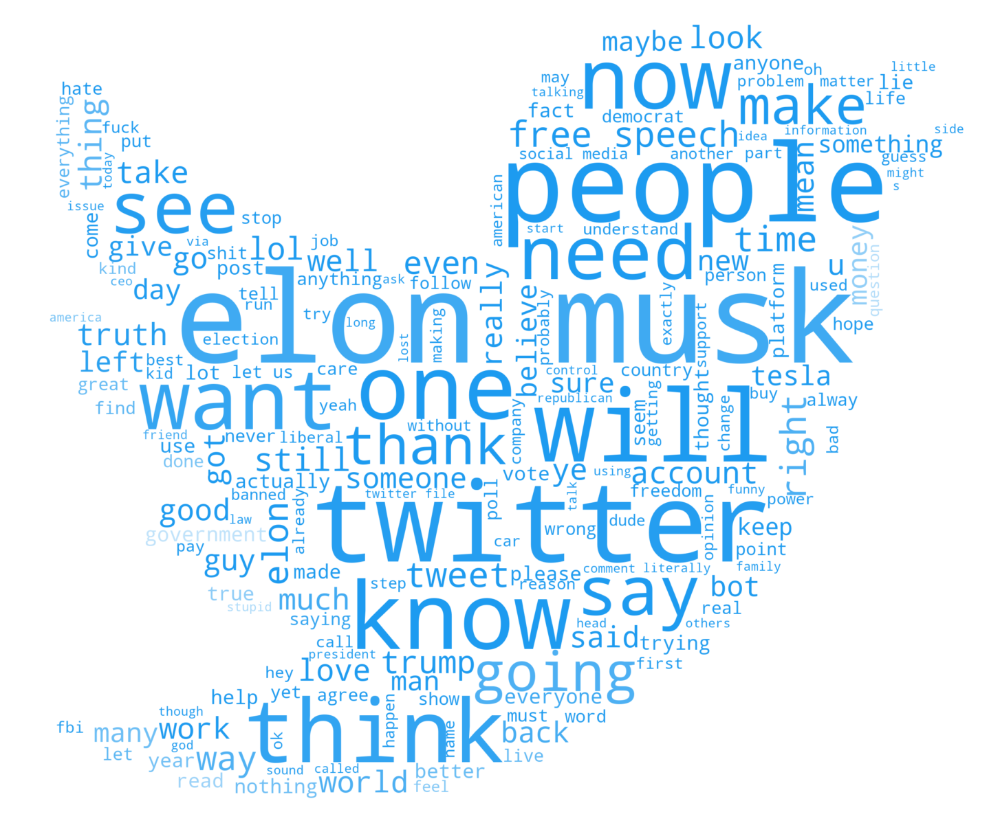

In [19]:
# Generate a word cloud image
mask = np.array(Image.open("twitter.jpg"))
stopwords = set(STOPWORDS)

wordcloud_twitter = WordCloud(height=2000,
                              width=2000,
                              background_color="white",
                              mode="RGBA",
                              stopwords=stopwords,
                              mask=mask).generate(all_words_lem)

# Create coloring from the image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud_twitter.recolor(color_func=image_colors), interpolation="bilinear")

# Store visualization to file
plt.savefig("twitter_logo_unigram.png", format="png")

plt.show()

## Mentions

In [20]:
# Retrieves all occurrences of @+text
df['mentions'] = df['text'].str.findall(r'@\w+')
# Removes the @ in front
df['mentions'] = [list(map(lambda x: x[1:], mentions)) for mentions in df['mentions']]
# Converts the list of words in each row to a string
df['mentions_string'] = df['mentions'].apply(lambda x: ' '.join(x))
# Concatenates all strings in one string
all_mentions = ' '.join([word for word in df['mentions_string']])

### With Elon Musk

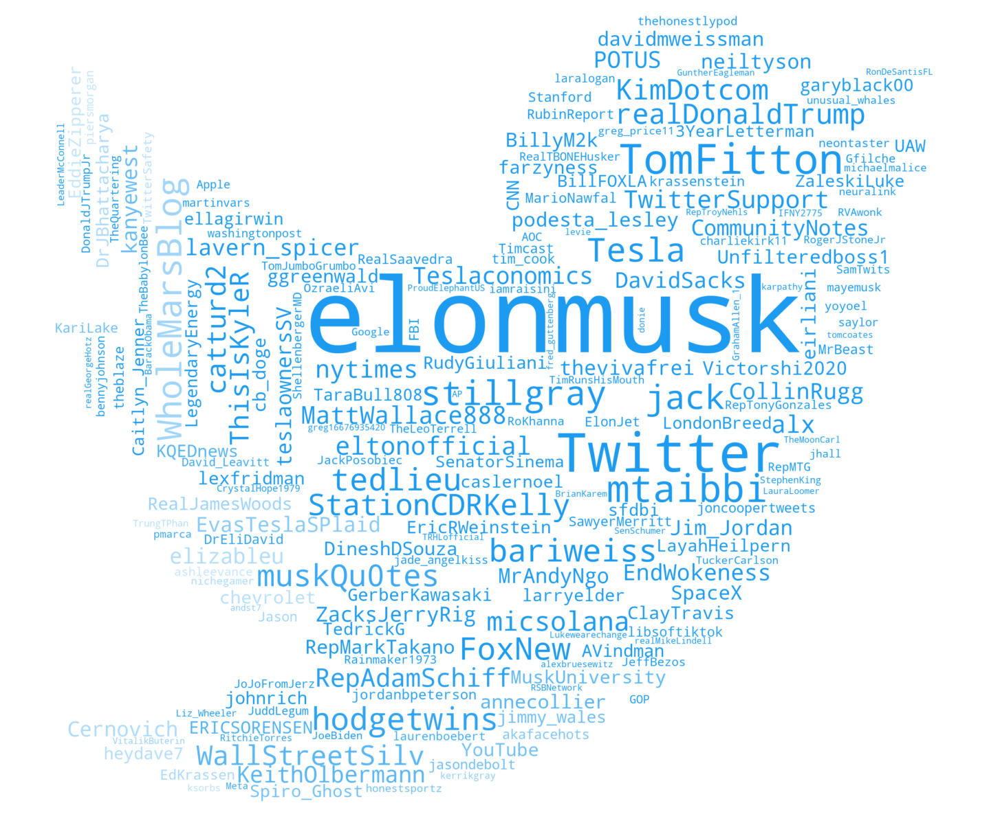

In [22]:
# Generate a word cloud image
mask = np.array(Image.open("twitter.jpg"))
stopwords = set(STOPWORDS)

wordcloud_twitter = WordCloud(height=2000,
                              width=2000,
                              background_color="white",
                              mode="RGBA",
                              stopwords=stopwords,
                              collocations = False,
                              mask=mask).generate(all_mentions)

# Create coloring from the image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud_twitter.recolor(color_func=image_colors), interpolation="bilinear")

# Store visualization to file
plt.savefig("twitter_logo_mentions.png", format="png")

plt.show()

### Without Elon Musk

In [23]:
word_to_remove = "elonmusk"
new_string = ""

for word in all_mentions.split():
    if word != word_to_remove:
        new_string += word + " "

new_string = new_string.strip()

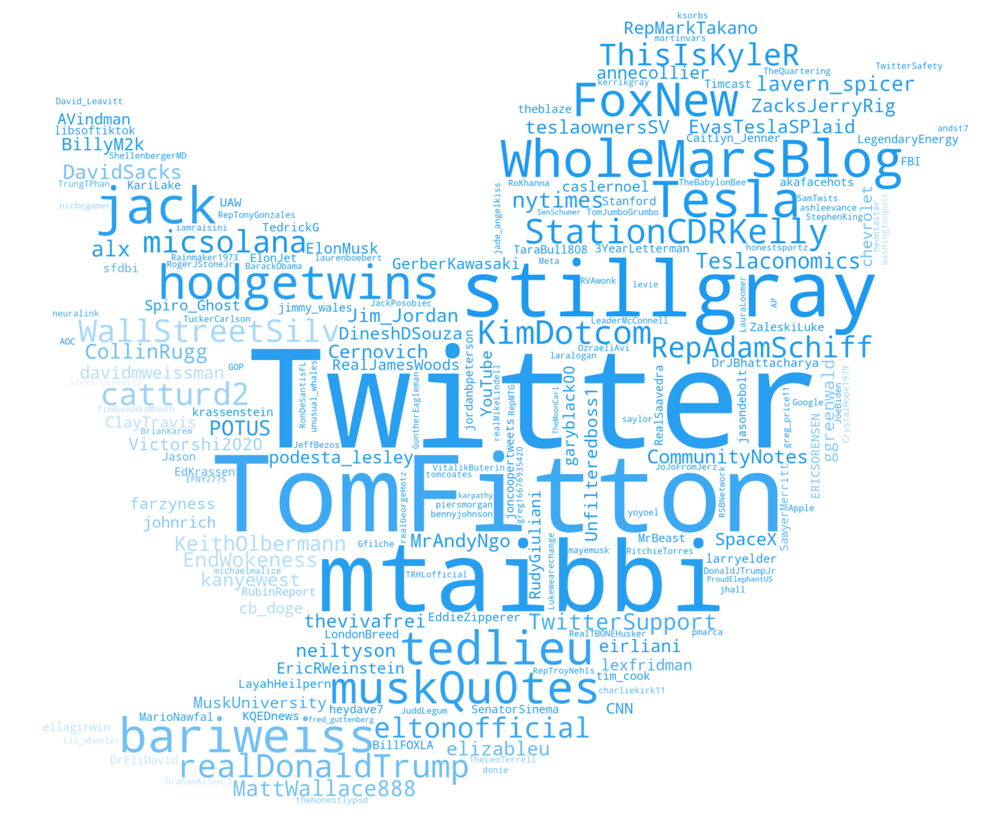

In [24]:
# Generate a word cloud image
mask = np.array(Image.open("twitter.jpg"))
stopwords = set(STOPWORDS)

wordcloud_twitter = WordCloud(height=2000,
                              width=2000,
                              background_color="white",
                              mode="RGBA",
                              stopwords=stopwords,
                              collocations = False,
                              mask=mask).generate(new_string)

# Create coloring from the image
image_colors = ImageColorGenerator(mask)
plt.figure(figsize=[20,20])
plt.axis('off')
plt.tight_layout(pad=0)
plt.imshow(wordcloud_twitter.recolor(color_func=image_colors), interpolation="bilinear")

# Store visualization to file
plt.savefig("twitter_logo_mentions_wo_elon.png", format="png")

plt.show()

## Emojis

In [26]:
# Define a function to extract emoticons
def extract_emoticons(text):
  res = emot_obj.emoji(text)
  return res['value']

In [27]:
# Apply the function to each row of the 'text' column
df['emoticons'] = df['text'].apply(extract_emoticons)

Issue with internal pattern finding emoji: '🇬'


In [28]:
df['emoticons'].apply(lambda x: collections.Counter(x))
combined_counts = sum(df['emoticons'].apply(lambda x: collections.Counter(x)), collections.Counter())
emoji_dict = dict(combined_counts)
sorted_emoji_dict = dict(sorted(emoji_dict.items(), key=lambda x: x[1], reverse=True))

In [29]:
d = {k: v for i, (k, v) in enumerate(sorted_emoji_dict.items()) if i < 20}
df_emojis = pd.DataFrame(list(d.items()), columns=['Emojis', 'Count'])
df_emojis.at[5, 'Emojis'] = '❤️'
df_emojis.at[6, 'Emojis'] = '🤡'

In [30]:
df_emojis.groupby('Emojis').sum()['Count'].sort_values(ascending=False).iplot(
    kind='bar',xTitle='Emojis', yTitle='Count', linecolor='black', title='The 20 most used emojis after removing spam')

# Unsupervised Sentiment Analysis

## Getting polarities

In [31]:
df['vader_polarity'] = df['processed_text'].map(lambda text: sid.polarity_scores(text)['compound'])
df['blob_polarity'] = df['processed_text'].map(lambda text: TextBlob(text).sentiment.polarity)

In [32]:
new_df = df[['vader_polarity', 'blob_polarity']]
new_df = new_df.rename(columns={'vader_polarity': 'Vader', 'blob_polarity': 'TextBlob'})

## Comparison between Vader and TextBlob

In [33]:
new_df.iplot(
    kind='hist',
    bins=40,
    xTitle='Polarity',
    linecolor='black',
    yTitle='Count',
    title='Comparison of the distributions of sentimental polarities',
    colors = ['#1DA1F2', '#EB8C17'],
    barmode="group")

## Stats

In [34]:
new_df.describe()

,Vader,TextBlob
count,487047.000000,487047.000000
mean,0.040615,0.067221
std,0.456807,0.289077
min,-0.999600,-1.000000
25%,-0.296000,0.000000
50%,0.000000,0.000000
75%,0.401900,0.200000
max,0.998200,1.000000


## Topic analysis

In [38]:
stop_words = nltk.corpus.stopwords.words('english')

def remove_stop_words(text):
    text = text.translate(str.maketrans('', '', string.punctuation))
    return ' '.join([word for word in text.split() if word.lower() not in stop_words])

df['stop_text'] = df['processed_text'].apply(lambda x: remove_stop_words(x))

In [39]:
# We define a list of topics
topics = ['free speech',
          'hunter biden',
          'twitter files',
          'freedom speech', 
          'right wing',
          'donald trump']

vader_sentiments = df['vader_polarity'].tolist()
textblob_sentiments = df['blob_polarity'].tolist()
text = df['stop_text'].tolist()

# We create a new column Topic
df['Topic'] = ""
for topic in topics:
    df.loc[df['stop_text'].str.contains(topic), 'Topic'] = topic

# We create a new DataFrame with columns topic / sentiment / source
data = []
for topic in topics:
    topic_rows = df[df['Topic'] == topic]
    # Average sentiment per topic
    vader_sentiments = topic_rows['vader_polarity'].sum() / topic_rows.shape[0]
    textblob_sentiments = topic_rows['blob_polarity'].sum() / topic_rows.shape[0]
    # Append data
    data.append({'Topic': topic, 'Sentiment': vader_sentiments, 'Source': 'Vader'})
    data.append({'Topic': topic, 'Sentiment': textblob_sentiments, 'Source': 'TextBlob'})

df_new = pd.DataFrame(data)

# Plot the sentiment for each topic
fig = px.bar(df_new,
             x='Topic',
             y='Sentiment',
             color='Source',
             barmode='group',
             color_discrete_sequence = ['#1DA1F2', '#EB8C17'],
             title='Comparative sentimental analysis by topic',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()

## Personalities

In [40]:
usernames = ['@Tesla', '@TomFitton', '@FoxNews', '@realDonaldTrump' , '@TwitterSupport', '@nytimes']
vader_sentiments = df['vader_polarity'].tolist()
textblob_sentiments = df['blob_polarity'].tolist()
text = df['text'].tolist()

# create a new column for the username
df['Mention'] = ""
for username in usernames:
    df.loc[df['text'].str.contains(username), 'Mention'] = username

# create a new dataframe with columns for username, sentiment, and sentiment source
data = []
for username in usernames:
    username_rows = df[df['Mention'] == username]
    vader_sentiments = username_rows['vader_polarity'].sum() / username_rows.shape[0]
    textblob_sentiments = username_rows['blob_polarity'].sum() / username_rows.shape[0]
    data.append({'Mention': username, 'Sentiment': vader_sentiments, 'Source': 'Vader'})
    data.append({'Mention': username, 'Sentiment': textblob_sentiments, 'Source': 'TextBlob'})
df_new = pd.DataFrame(data)

# plot the sentiment for each username using Plotly
fig = px.bar(df_new,
             x='Mention',
             y='Sentiment',
             color='Source',
             barmode='group',
             color_discrete_sequence = ['#1DA1F2', '#EB8C17'],
             title='Comparative sentimental analysis by accounts',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()

## Trigrams

In [42]:
tri_grams = ['hunter biden laptop',
             'elon musk twitter',
             'real time location',
             'free speech absolutist',
             'free speech twitter']
vader_sentiments = df['vader_polarity'].tolist()
textblob_sentiments = df['blob_polarity'].tolist()
text = df['text'].tolist()

# create a new column for the username
df['Trigram'] = ""
for trigram in tri_grams:
    df.loc[df['text'].str.contains(trigram), 'Trigram'] = trigram

# create a new dataframe with columns for username, sentiment, and sentiment source
data = []
for trigram in tri_grams:
    trigram_rows = df[df['Trigram'] == trigram]
    vader_sentiments = trigram_rows['vader_polarity'].sum() / trigram_rows.shape[0]
    textblob_sentiments = trigram_rows['blob_polarity'].sum() / trigram_rows.shape[0]
    data.append({'Trigram': trigram, 'Sentiment': vader_sentiments, 'Source': 'Vader'})
    data.append({'Trigram': trigram, 'Sentiment': textblob_sentiments, 'Source': 'TextBlob'})
df_new = pd.DataFrame(data)

# plot the sentiment for each username using Plotly
fig = px.bar(df_new,
             x='Trigram',
             y='Sentiment',
             color='Source',
             barmode='group',
             color_discrete_sequence = ['#1DA1F2', '#EB8C17'],
             title='Emotional analysis of the most present tri-grams',
             template='plotly_white')

fig.update_traces(marker_line_width=1,
                  marker_line_color="black")

fig.show()